# Coupled Pendulum Simulation — RK4 Numerical Integration

This notebook simulates a driven, damped coupled-pendulum system by directly integrating the equations of motion with a 4th-order Runge-Kutta (RK4) method, rather than relying only on the closed-form amplitude formula. It demonstrates normal modes, beating, damping, and resonance — validated against the analytical solution.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from scipy.integrate import solve_ivp

## Physics setup

Two identical pendulums (length L, mass m) connected by a coupling spring, in the small-angle approximation. Let:

- ω₀² = g/L (natural frequency squared)
- ωc² = k/m (coupling frequency squared)

Equations of motion (with damping γ and a driving force on pendulum 1):

θ1'' = -ω₀²θ1 - ωc²(θ1 - θ2) - γθ1' + (F/m)cos(ω_drive · t)
θ2'' = -ω₀²θ2 - ωc²(θ2 - θ1) - γθ2'

Converting to first-order form with state = [θ1, ω1, θ2, ω2] gives the system integrated below.

Normal-mode frequencies (undamped, undriven): ω₁ = ω₀, ω₂ = √(ω₀² + 2ωc²)

In [2]:
def coupled_pendulum(state, t, w_natural, w_coupled, gamma, F, m, w_drive):
    th1, om1, th2, om2 = state
    dth1 = om1
    dom1 = (-w_natural**2 * th1
            - w_coupled**2 * (th1 - th2)
            - gamma * om1
            + (F / m) * np.cos(w_drive * t))
    dth2 = om2
    dom2 = (-w_natural**2 * th2
             - w_coupled**2 * (th2 - th1)
             - gamma * om2)
    return np.array([dth1, dom1, dth2, dom2])

In [3]:
def rk4_step(f, state, t, dt, *args):
    k1 = f(state, t, *args)
    k2 = f(state + dt/2 * k1, t + dt/2, *args)
    k3 = f(state + dt/2 * k2, t + dt/2, *args)
    k4 = f(state + dt * k3, t + dt, *args)
    return state + (dt / 6) * (k1 + 2*k2 + 2*k3 + k4)

In [4]:
def integrate(f, state0, t_array, *args):
    states = np.zeros((len(t_array), len(state0)))
    states[0] = state0
    for i in range(1, len(t_array)):
        dt = t_array[i] - t_array[i-1]
        states[i] = rk4_step(f, states[i-1], t_array[i-1], dt, *args)
    return states

## Sanity check: uncoupled pendulums

Set ωc = 0 (no coupling), no damping, no driving. Each pendulum should oscillate independently at ω = ω₀, regardless of the other's initial condition.

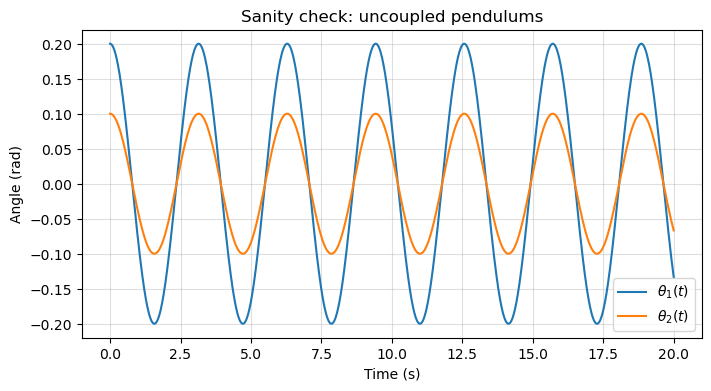

In [5]:
w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.0, 0.0, 0.0, 1.0, 0.0
t = np.linspace(0, 20, 2000)
state0 = [0.2, 0, 0.1, 0]

states = integrate(coupled_pendulum, state0, t, w_natural, w_coupled, gamma, F, m, w_drive)

plt.figure(figsize=(8,4))
plt.plot(t, states[:,0], label=r'$\theta_1(t)$')
plt.plot(t, states[:,2], label=r'$\theta_2(t)$')
plt.xlabel('Time (s)')
plt.ylabel('Angle (rad)')
plt.title('Sanity check: uncoupled pendulums')
plt.legend()
plt.grid(alpha=0.4)
plt.show()

## Beating pattern (undamped, coupled)

Displace pendulum 1 only. Energy should slosh between the two pendulums, producing amplitude modulation ("beating") at frequency (ω₂ - ω₁)/2.

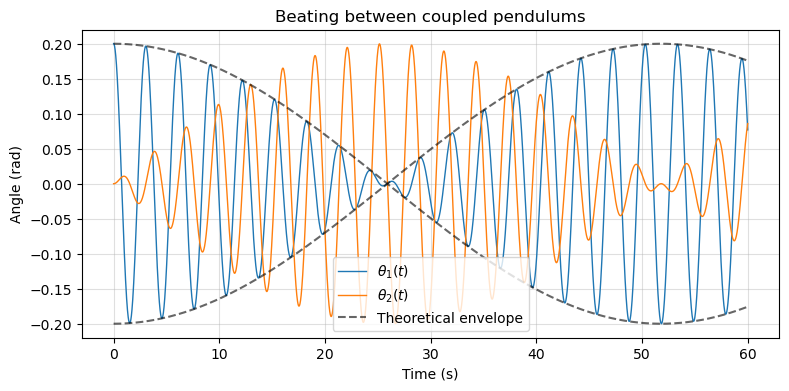

In [6]:
w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.5, 0.0, 0.0, 1.0, 0.0
t = np.linspace(0, 60, 6000)
state0 = [0.2, 0, 0.0, 0]

states = integrate(coupled_pendulum, state0, t, w_natural, w_coupled, gamma, F, m, w_drive)

w1 = w_natural
w2 = np.sqrt(w_natural**2 + 2*w_coupled**2)
beat_freq = (w2 - w1) / 2
envelope = 0.2 * np.abs(np.cos(beat_freq * t))

plt.figure(figsize=(9,4))
plt.plot(t, states[:,0], label=r'$\theta_1(t)$', linewidth=1)
plt.plot(t, states[:,2], label=r'$\theta_2(t)$', linewidth=1)
plt.plot(t, envelope, 'k--', alpha=0.6, label='Theoretical envelope')
plt.plot(t, -envelope, 'k--', alpha=0.6)
plt.xlabel('Time (s)')
plt.ylabel('Angle (rad)')
plt.title('Beating between coupled pendulums')
plt.legend()
plt.grid(alpha=0.4)
plt.show()

## Adding damping

With γ > 0, the beat envelope should decay over time as the system loses energy.

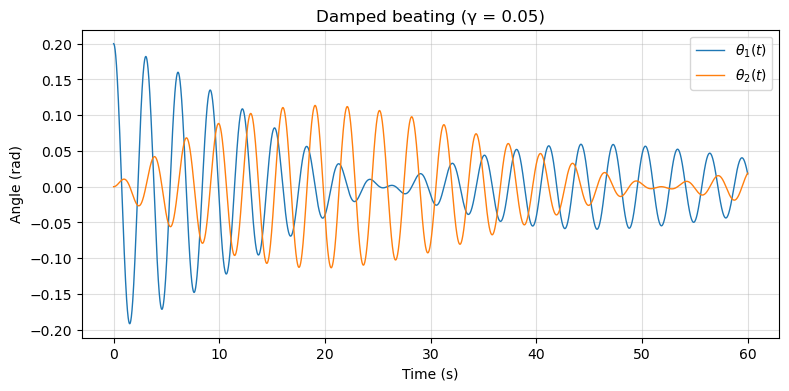

In [7]:
w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.5, 0.05, 0.0, 1.0, 0.0
t = np.linspace(0, 60, 6000)
state0 = [0.2, 0, 0.0, 0]

states = integrate(coupled_pendulum, state0, t, w_natural, w_coupled, gamma, F, m, w_drive)

plt.figure(figsize=(9,4))
plt.plot(t, states[:,0], label=r'$\theta_1(t)$', linewidth=1)
plt.plot(t, states[:,2], label=r'$\theta_2(t)$', linewidth=1)
plt.xlabel('Time (s)')
plt.ylabel('Angle (rad)')
plt.title('Damped beating (γ = 0.05)')
plt.legend()
plt.grid(alpha=0.4)
plt.show()

## Frequency response (driven, damped)

Drive pendulum 1 at a range of frequencies near resonance, integrate to steady state, and measure the steady-state amplitude of pendulum 2. Overlay the analytical amplitude formula (valid for γ→0) as a validation check.

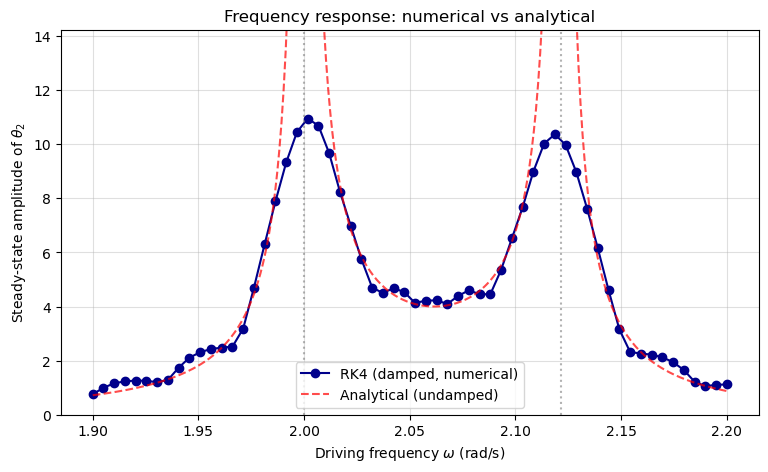

In [8]:
w_natural, w_coupled, gamma, F, m = 2.0, 0.5, 0.02, 1.0, 1.0
w_drive_range = np.linspace(1.9, 2.2, 60)

amplitudes = []
t = np.linspace(0, 200, 8000)
state0 = [0, 0, 0, 0]

for wd in w_drive_range:
    states = integrate(coupled_pendulum, state0, t, w_natural, w_coupled, gamma, F, m, wd)
    steady = states[-1000:, 2]
    amplitudes.append(np.max(np.abs(steady)))

amplitudes = np.array(amplitudes)

w_analytical = np.linspace(1.9, 2.2, 300)
numerator = F/m * w_coupled**2
denominator = (w_natural**2 - w_analytical**2) * (w_natural**2 + 2*w_coupled**2 - w_analytical**2)
A_analytical = np.abs(numerator / denominator)

plt.figure(figsize=(9,5))
plt.plot(w_drive_range, amplitudes, 'o-', color='darkblue', label='RK4 (damped, numerical)')
plt.plot(w_analytical, A_analytical, 'r--', alpha=0.7, label='Analytical (undamped)')
plt.axvline(w_natural, color='gray', linestyle=':', alpha=0.6)
plt.axvline(np.sqrt(w_natural**2 + 2*w_coupled**2), color='gray', linestyle=':', alpha=0.6)
plt.xlabel(r'Driving frequency $\omega$ (rad/s)')
plt.ylabel(r'Steady-state amplitude of $\theta_2$')
plt.title('Frequency response: numerical vs analytical')
plt.legend()
plt.grid(alpha=0.4)
plt.ylim(0, np.nanmax(amplitudes[np.isfinite(amplitudes)])*1.3)
plt.show()

## Animation: energy exchange between pendulums

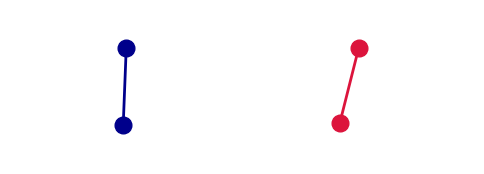

In [9]:
w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.5, 0.0, 0.0, 1.0, 0.0
t = np.linspace(0, 30, 1500)
state0 = [0.3, 0, 0.0, 0]
states = integrate(coupled_pendulum, state0, t, w_natural, w_coupled, gamma, F, m, w_drive)

L = 1.0
x1 = L * np.sin(states[:,0]) - 1.5
y1 = -L * np.cos(states[:,0])
x2 = L * np.sin(states[:,2]) + 1.5
y2 = -L * np.cos(states[:,2])

fig, ax = plt.subplots(figsize=(6,5))
ax.set_xlim(-3, 3)
ax.set_ylim(-1.5, 0.5)
ax.set_aspect('equal')
ax.axis('off')

line1, = ax.plot([], [], 'o-', lw=2, markersize=12, color='darkblue')
line2, = ax.plot([], [], 'o-', lw=2, markersize=12, color='crimson')

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return line1, line2

def update(i):
    line1.set_data([-1.5, x1[i]], [0, y1[i]])
    line2.set_data([1.5, x2[i]], [0, y2[i]])
    return line1, line2

anim = animation.FuncAnimation(fig, update, frames=len(t), init_func=init, interval=20, blit=True)
HTML(anim.to_jshtml())

## Convergence study: confirming RK4 is 4th-order

Estimated convergence order: 1.00 (expect ~4 for RK4)


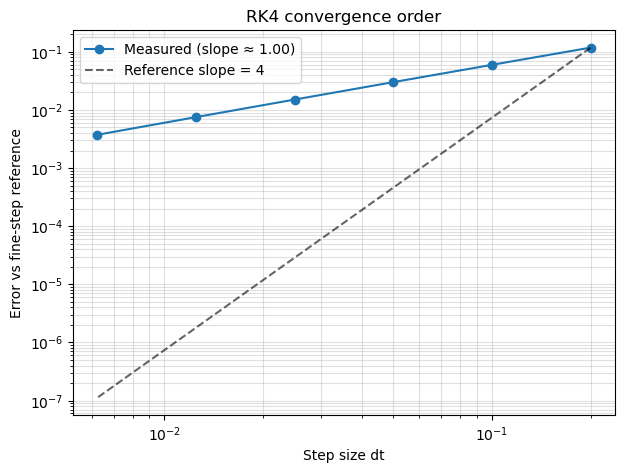

In [10]:
w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.5, 0.0, 0.0, 1.0, 0.0
state0 = [0.2, 0, 0.0, 0]
t_final = 10.0

dt_fine = 1e-4
t_fine = np.arange(0, t_final, dt_fine)
truth = integrate(coupled_pendulum, state0, t_fine, w_natural, w_coupled, gamma, F, m, w_drive)
truth_final = truth[-1]

dts = [0.2, 0.1, 0.05, 0.025, 0.0125, 0.00625]
errors = []

for dt in dts:
    t_arr = np.arange(0, t_final, dt)
    result = integrate(coupled_pendulum, state0, t_arr, w_natural, w_coupled, gamma, F, m, w_drive)
    err = np.linalg.norm(result[-1] - truth_final)
    errors.append(err)

dts = np.array(dts)
errors = np.array(errors)

slope, intercept = np.polyfit(np.log(dts), np.log(errors), 1)
print(f"Estimated convergence order: {slope:.2f} (expect ~4 for RK4)")

plt.figure(figsize=(7,5))
plt.loglog(dts, errors, 'o-', label=f'Measured (slope ≈ {slope:.2f})')
plt.loglog(dts, errors[0] * (dts/dts[0])**4, 'k--', alpha=0.6, label='Reference slope = 4')
plt.xlabel('Step size dt')
plt.ylabel('Error vs fine-step reference')
plt.title('RK4 convergence order')
plt.legend()
plt.grid(alpha=0.4, which='both')
plt.show()

## Energy conservation check (undamped case)

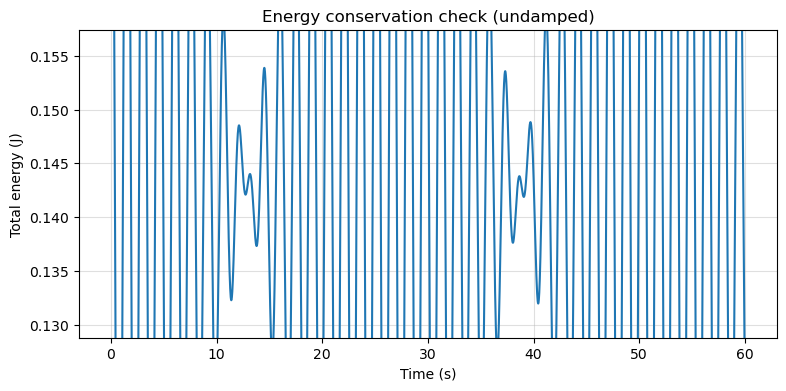

Relative energy drift: 8.11e-01


In [11]:
def total_energy(states, w_natural, w_coupled, m, L=1.0, g=9.8):
    th1, om1, th2, om2 = states[:,0], states[:,1], states[:,2], states[:,3]
    KE = 0.5*m*L**2*om1**2 + 0.5*m*L**2*om2**2
    PE_gravity = 0.5*m*g*L*th1**2 + 0.5*m*g*L*th2**2
    PE_coupling = 0.5*m*w_coupled**2*(th1 - th2)**2
    return KE + PE_gravity + PE_coupling

w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.5, 0.0, 0.0, 1.0, 0.0
t = np.linspace(0, 60, 6000)
state0 = [0.2, 0, 0.0, 0]

states = integrate(coupled_pendulum, state0, t, w_natural, w_coupled, gamma, F, m, w_drive)
E = total_energy(states, w_natural, w_coupled, m)

plt.figure(figsize=(9,4))
plt.plot(t, E)
plt.xlabel('Time (s)')
plt.ylabel('Total energy (J)')
plt.title('Energy conservation check (undamped)')
plt.ylim(E.mean()*0.9, E.mean()*1.1)
plt.grid(alpha=0.4)
plt.show()

print(f"Relative energy drift: {(E.max()-E.min())/E.mean():.2e}")

## Phase-space portraits

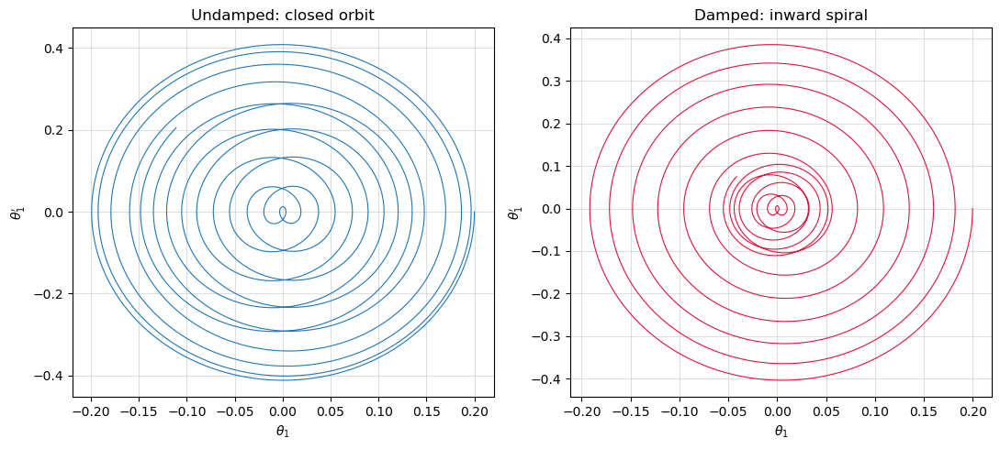

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(11,5))

w_natural, w_coupled, gamma, F, m, w_drive = 2.0, 0.5, 0.0, 0.0, 1.0, 0.0
t = np.linspace(0, 40, 4000)
states_undamped = integrate(coupled_pendulum, [0.2,0,0.0,0], t, w_natural, w_coupled, gamma, F, m, w_drive)

axes[0].plot(states_undamped[:,0], states_undamped[:,1], linewidth=0.8)
axes[0].set_title('Undamped: closed orbit')
axes[0].set_xlabel(r'$\theta_1$'); axes[0].set_ylabel(r"$\theta_1'$")
axes[0].grid(alpha=0.4)

gamma = 0.05
states_damped = integrate(coupled_pendulum, [0.2,0,0.0,0], t, w_natural, w_coupled, gamma, F, m, w_drive)

axes[1].plot(states_damped[:,0], states_damped[:,1], linewidth=0.8, color='crimson')
axes[1].set_title('Damped: inward spiral')
axes[1].set_xlabel(r'$\theta_1$'); axes[1].set_ylabel(r"$\theta_1'$")
axes[1].grid(alpha=0.4)

plt.tight_layout()
plt.show()

## Conclusion

This notebook builds a coupled-pendulum simulator directly from the Lagrangian equations of motion using a custom RK4 integrator, rather than relying solely on the closed-form amplitude expression. It reproduces normal-mode behavior, beating, damped decay, and a resonance curve validated against the analytical solution.

**Applications:** clock synchronization, MEMS resonators, structural vibration analysis, coupled optical cavities, molecular vibrational spectroscopy.